**TITLE**: T-SNE visualization of the S&P 500 data  
**AUTHOR**: Pablo Carrera Flórez de Quiñones  
**DATE**: April 2020  

# INTRODUCTION

## Statement of the problem

Portfolio optimization is the process of selecting the best portfolio (asset distribution), out of the set of all portfolios being considered, according to some objective. The objective typically maximizes factors such as expected return, and minimizes costs like financial risk through a correct diversification. The usual way to test this optimal portfolio is to compare its perfomance against a well known stock index, using it as a benchmark for the possible returns. A stock index, or stock market index, is an index that measures a stock market, or a subset of the stock market, that helps investors compare current price levels with past prices to calculate market performance. It is computed from the prices of selected stocks (typically a weighted arithmetic mean).

The Dow Jones Industrial Average (DJIA), or simply Dow Jones, is a stock market index that measures the stock performance of 30 large companies listed on stock exchanges in the United States. This is by far the most followed index in US stock markets. The value of the index is the sum of the price of one share of stock for each component company divided by a factor which changes whenever one of the component stocks has a stock split or stock dividend, so as to generate a consistent value for the index. The Industrial portion of the name is largely historical, as many of the modern 30 components have little or nothing to do with traditional heavy industry. The index is maintained by S&P Dow Jones Indices, a joint venture majority-owned by S&P Global and its components are selected by a committee.

In this work, inspired by the *Machine Learning and Reinforcement Learning in Finance Specialization* of *Coursera*, we are going to study a proposal for portfolio optimization based on the construction of eigen-portfolios using Principal Component Analysis (PCA) \[1\]. This will provide a model-free factor analysis, in the sense that we do not rely on any factors such as value or momentum to decompose portfolio returns, but instead using PCA to deduce structure of portfolio returns.

## References

\[1\] Marco Avellaneda & Jeong-Hyun Lee (2010) *Statistical arbitrage in the US equities market*, Quantitative Finance, 10(7), 761-782, DOI: [10.1080/14697680903124632](https://doi.org/10.1080/14697680903124632)

\[2\] Laurens van der Maaten and Geoffrey Hinton (2008), *Visualizing High-Dimensional Data Using t-SNE*, Journal of Machine Learning Research, 9(Nov), 2579-2605.

# DATA

## Libraries

In [15]:
# Basics
import pandas as pd
import numpy as np
import random

# Domain specific
import pandas_datareader as pdr
from datetime import datetime

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Machine Learning
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA, KernelPCA

from sklearn.linear_model import LinearRegression



from sklearn import neighbors
from sklearn.svm import SVC
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier

import operator
import time




## Importing data

We are going to construct our visualization taking into account the stocks contained into S&P 500 index, which is one of the most followed indicators of the market state. So, the first step in our project is to obtain the data of the daily prices of these stocks. We can obtain this data from Yahoo Finance by running the script *download_stocks_SP500.py* in *utils* folder.

In [16]:
# Import the data after running the script
df = pd.read_csv('data/SP500_stocks_2000_2019.csv', index_col = 0, parse_dates = True)

# Show a sample of the data
df.head()

,MMM,ABT,ABBV,ABMD,ACN,ATVI,ADBE,AMD,AAP,AES,...,XRX,XLNX,XYL,YUM,ZBRA,ZBH,ZION,ZTS,^GSPC,VIAC
2000-01-03,47.1875,15.711531,NaN,18.25000,NaN,1.369792,16.390625,15.500,NaN,36.25000,...,63.735176,46.7500,NaN,6.706057,25.027779,NaN,55.5000,NaN,1455.219971,NaN
2000-01-04,45.3125,15.262630,NaN,17.81250,NaN,1.328125,15.015625,14.625,NaN,34.81250,...,60.770752,45.6875,NaN,6.571262,24.666666,NaN,52.8125,NaN,1399.420044,NaN
2000-01-05,46.6250,15.234573,NaN,18.00000,NaN,1.333333,15.312500,15.000,NaN,35.18750,...,63.899868,44.6875,NaN,6.604960,25.138889,NaN,52.7500,NaN,1402.109985,NaN
2000-01-06,50.3750,15.767643,NaN,18.03125,NaN,1.307292,15.437500,16.000,NaN,35.46875,...,62.582344,40.8125,NaN,6.548796,23.777779,NaN,53.5000,NaN,1403.449951,NaN
2000-01-07,51.3750,15.935981,NaN,17.93750,NaN,1.343750,16.187500,16.250,NaN,36.15625,...,64.064560,45.4375,NaN,6.402768,23.513889,NaN,53.6250,NaN,1441.469971,NaN


Now, it is always a good idea to look for mising values at the data,

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 5031 entries, 2000-01-03 to 2019-12-31
Columns: 506 entries, MMM to VIAC
dtypes: float64(506)
memory usage: 19.5 MB


so we can see that some prices have a grear quantity of missing values, this is due to the fact that they became public after the year 2000, so there are no prices below these years. Since we need all time-series to have the same lenght we are going to delete them:

In [18]:
df = df.dropna(axis = 1)
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 5031 entries, 2000-01-03 to 2019-12-31
Columns: 364 entries, MMM to ^GSPC
dtypes: float64(364)
memory usage: 14.0 MB


And now, we can plot the historical evolution of the prices

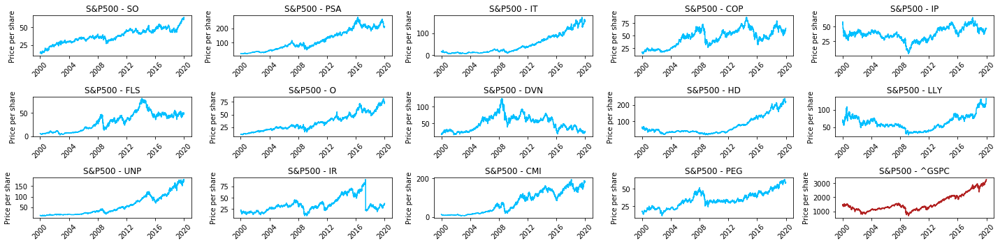

In [19]:
# Select some stocks to plot
random.seed(0)
stocks_to_plot = random.choices(df.columns.to_list()[:-1], k = 14) + ['^GSPC']

# Make the layout
n_rows = 3
n_cols = 5

plt.figure(figsize = (20,5))
for i,stock in enumerate(stocks_to_plot):
    # Choose the color
    if stock == '^GSPC':
        color = 'firebrick'
    else:
        color = 'deepskyblue'

    # Plot the stock prices
    plt.subplot(n_rows, n_cols, i + 1)
    sns.lineplot(x = df.index, y = df[stock], color = color)

    # Formatting
    plt.title('S&P500 - {}'.format(stock))
    plt.xlabel('')
    plt.ylabel('Price per share')
    plt.xticks(rotation = 45)

# Formatting
plt.tight_layout()
plt.show()

# MODELLING

## Computation of returns

It is a common practice not to analize the price series itself, but its retuns. The returns are computed as the porcentual change in the price series, that is, if the price for an asset $i$ at time $t$ is given by $p_i^{t}$ then its return will be given by

$$ r_i^t = \frac{p_i^t - p_i^{t-1}}{p_i^{t-1}} $$

and it is also common to compute the log-returns, which are simply a logarithmic version of these returns

$$ r_i^{'t} = \log \frac{p_i^t - p_i^{t-1}}{p_i^{t-1}} $$

which provide a smoother representation of the series.

Since some stocks are more volatile than others, it is convenient to work with standardized returns, that is, to substract the mean $\mu_i$ of each return and divide the residual by the return's standard deviation $\sigma_i$, given by

\begin{align*}
    & \mu_i = \frac{1}{T} \sum_{t=1}^T r_i^t \\
    & \sigma_i^2 = \frac{1}{T-1} \sum_{t=1}^T (r_i^t - \mu_i)^2 \ 
\end{align*}

so we get

$$ r_i^t = \frac{r_i^t - \mu_i}{\sigma_i} $$

In [21]:
# Compute the returns
df_returns = df.pct_change().dropna(axis = 0)

# Standarize the returns
df_mean = df_returns.mean(axis = 0)
df_volatility = df_returns.std(axis = 0)
df_stand = (df_returns - df_mean) / df_volatility

And visualizing the returns

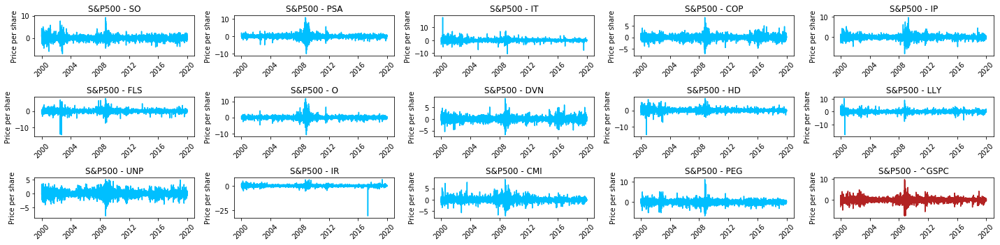

In [25]:
# Make the layout
n_rows = 3
n_cols = 5

plt.figure(figsize = (20,5))
for i,stock in enumerate(stocks_to_plot):
    # Choose the color
    if stock == '^GSPC':
        color = 'firebrick'
    else:
        color = 'deepskyblue'

    # Plot the stock prices
    plt.subplot(n_rows, n_cols, i + 1)
    sns.lineplot(x = df_stand.index, y = df_stand[stock], color = color)

    # Formatting
    plt.title('S&P500 - {}'.format(stock))
    plt.xlabel('')
    plt.ylabel('Returns')
    plt.xticks(rotation = 45)

# Formatting
plt.tight_layout()
plt.show()

## Returns regression on S&P 500 Index

In the previous visualizations we can see some resemblance between the stock prices/returns and the S&P 500 prices/returns. In this section we are going to explore this. We start by ploting the stock prices against the market index

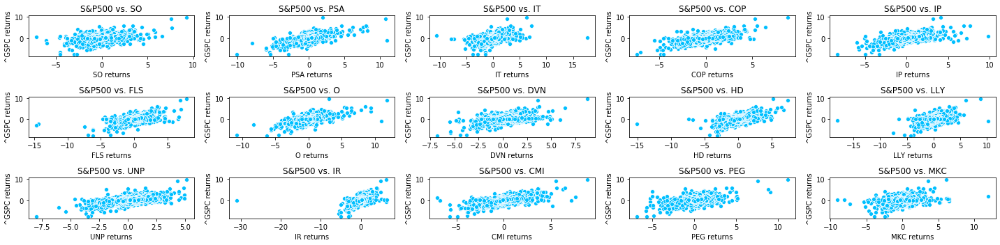

In [33]:
# Select some stocks to plot
random.seed(0)
stocks_to_plot = random.choices(df.columns.to_list()[:-1], k = 15)

# Make the layout
n_rows = 3
n_cols = 5

plt.figure(figsize = (20,5))
for i,stock in enumerate(stocks_to_plot):

    # Plot the stock prices
    plt.subplot(n_rows, n_cols, i + 1)
    sns.scatterplot(x = df_stand[stock], y = df_stand['^GSPC'], color = 'deepskyblue')

    # Formatting
    plt.title('S&P500 vs. {}'.format(stock))
    plt.xlabel('{} returns'.format(stock))
    plt.ylabel('^GSPC returns')

# Formatting
plt.tight_layout()
plt.show()

where we can see that they are related in a linear fashion.

Now, we can think about building a model for the returns of the stocks into the index. One possible model is a simple linear regression of the returns $r_i$ into a single predictor $r_M$ usuall called the market factor, and represented by a market index, such as S&P 500 in our case.

$$ r_i (t) = \alpha_i + \beta_i r_M(t) + \varepsilon $$

In [50]:
# Obtain a test set and a training set
X = df_returns.drop('^GSPC', axis = 1)
y = df_returns[['^GSPC']]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)

# Initialize the table for the results
df_regression = pd.DataFrame(columns = ['Stock','Alpha','Beta','R2_train','R2_test'])

# Compute the models
for i,stock in enumerate(df_returns.columns.tolist()[:-1]):
    # Create and train the model
    lr = LinearRegression()
    lr.fit(X_train[[stock]],y_train)

    # Save the details of the model
    df_regression = df_regression.append({'Stock'    : stock,
                                          'Alpha'    : lr.intercept_[0],
                                          'Beta'     : lr.coef_[0][0],
                                          'R2_train' : lr.score(X_train[[stock]],y_train),
                                          'R2_test'  : lr.score(X_test[[stock]],y_test)
                                           },  
                                           ignore_index = True)

# Show a sample of the results
df_regression.head()

,Stock,Alpha,Beta,R2_train,R2_test
0,MMM,0.000025,0.550569,0.463012,0.474886
1,ABT,0.000070,0.364537,0.209762,0.275796
2,ABMD,0.000177,0.123325,0.147338,0.125342
3,ATVI,0.000085,0.196434,0.209853,0.196866
4,ADBE,0.000024,0.258974,0.370955,0.327171


In [ ]:
n_rows = 1
n_cols = 5

plt.figure(figsize = (20,5))
for i, var in enumerate(df_regression.columns.tolist()):
    plt.subplot(n_rows, n_cols, i + 1)
    sns.distplot(df_regression[var], bins = 20)
plt.tight_layout()
plt.show()



$$ \varepsilon_i (t) = r_i (t) - [ \alpha_i + \beta_i r_M(t) ] $$

- Use **df_train**  and calculated in Part 2 **df_lr** with $\beta$ and $\alpha$ to compute unexpected log returns
- Calculate unexplained log-returns as difference between the stock return and its value, "predicted" by the index return.

$$ \epsilon^i_t = R^i_t - \alpha_i - \beta_i R^M_t$$

- Store unexplained log-returns in df_unexplained pnadas.DataFrame

In [88]:
df_unexplained = df_train.loc[:, stock_tickers]

### START CODE HERE ### (≈ 4-10 lines of code)
### ...
df = pd.DataFrame(index=df_train.index, columns=stock_tickers).fillna(0)
df = (df.T + df_train['SPX'].values).T 
df_unexplained = df_train[stock_tickers] - (df_lr['Alpha'] + df_lr['Beta'] * df)

### END CODE HERE ###

print('Unexplained log-returns of S&P 500 Index stocks', df_unexplained.shape)
print('Unexplained log-returns of S&P 500 Index stocks:')
df_unexplained.iloc[:, :10].head()

Unexplained log-returns of S&P 500 Index stocks (3055, 418)
Unexplained log-returns of S&P 500 Index stocks:


,A,AA,AAPL,ABC,ABT,ADBE,ADI,ADM,ADP,ADSK
2000-01-28,1.042699,0.958259,-1.627829,0.815262,3.056585,-1.522426,1.053955,0.322498,-0.219042,-0.635088
2000-01-31,-1.990722,-1.193765,-0.289570,-2.540007,0.540397,-2.560558,-1.833211,-1.234180,-3.068782,-1.447484
2000-02-01,1.818522,0.703883,-1.587967,1.210541,0.251689,-0.007182,1.118464,0.565542,0.448237,0.804120
2000-02-02,2.429032,1.222879,-0.514452,0.480108,0.352210,3.002779,-0.602783,-1.004828,-3.396594,0.194417
2000-02-03,0.040778,-1.711177,1.033078,-0.719335,-0.017217,3.343853,2.686136,-0.451039,3.413969,0.725667


## Crisis visualization

In [83]:
# Assign a label 'regime' to each date:
# 'regime' = 'benign' for all points except two intervals
# 'regime' = 'crisis_2001_2002', or
# 'regime = ', 'crisis_2007-2009'

# first assign the default value for all rows
log_ret_df_std['regime'] = 'benign'
dt_start = np.datetime64('2000-03-24T00:00:00.000000000')
dt_end = np.datetime64('2002-10-09T00:00:00.000000000')
flag_crisis_2001_2002 = np.logical_and(log_ret_df_std.index > dt_start, log_ret_df_std.index < dt_end)

dt_start = np.datetime64('2007-10-09T00:00:00.000000000')
dt_end = np.datetime64('2009-03-09T00:00:00.000000000')
flag_crisis_2007_2009 = np.logical_and(log_ret_df_std.index > dt_start, log_ret_df_std.index < dt_end)

log_ret_df_std.loc[flag_crisis_2001_2002,'regime'] = 'crisis_2001_2002'
log_ret_df_std.loc[flag_crisis_2007_2009, 'regime'] = 'crisis_2007_2009'

print('crisis_2001_2002', log_ret_df_std[log_ret_df_std.regime == 'crisis_2001_2002'].shape[0])
print('crisis_2007_2009', log_ret_df_std[log_ret_df_std.regime == 'crisis_2007_2009'].shape[0])
print(log_ret_df_std.shape)

print('Last N days of the dataset:')
log_ret_df_std.iloc[:, :10].tail()

crisis_2001_2002 635
crisis_2007_2009 354
(3492, 420)
Last N days of the dataset:


,A,AA,AAPL,ABC,ABT,ADBE,ADI,ADM,ADP,ADSK
2013-12-16,0.048156,0.240452,0.156457,-0.040166,0.209504,-1.308457,0.229593,0.353842,0.378619,-0.431163
2013-12-17,0.657942,0.501195,-0.180108,-0.115249,0.121412,-0.474871,0.138236,0.922656,-0.217628,0.216760
2013-12-18,0.864258,0.494531,-0.284769,0.897945,2.566273,0.747634,0.575724,1.831260,1.417926,0.549664
2013-12-19,-0.285876,0.524670,-0.415206,-0.025413,-0.169652,-0.515127,-0.082096,0.686380,0.246457,-0.183206
2013-12-20,-0.237193,-0.095901,0.250960,0.099780,-0.338791,0.610861,0.237364,-0.483890,0.404861,0.813525


#### Part 4 (Kernel PCA of Covariance Matrix of Returns)

**Instructions:**
- Perform Kernel PCA with 1 component using returns data **df_test** for all stocks in df_test
- Transform original mapping in the coordinates of the first principal component
- Assign tranformed returns to PCA_1 in **** DataFrame
 

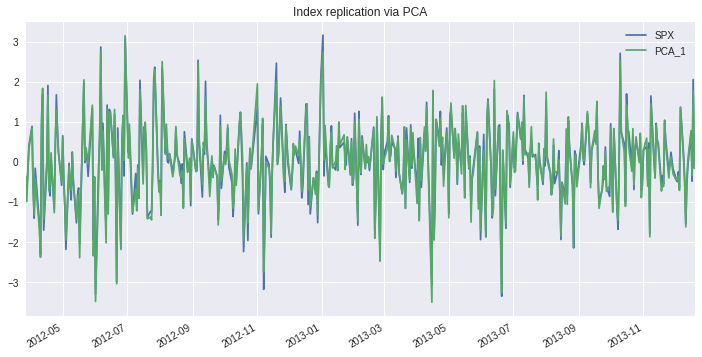

In [91]:
stock_tickers = asset_returns.columns.values[:-1]
assert 'SPX' not in stock_tickers, "By accident included SPX index"
data = df_test[stock_tickers].values

df_index_test = pd.DataFrame(data=df_test['SPX'].values, index=df_test.index, columns=['SPX'])
df_index_test['PCA_1'] = np.ones(len(df_test.index)) 

### START CODE HERE ### (≈ 2-3 lines of code)
# please set random_state=42 when initializing Kernel PCA
kpca = KernelPCA(n_components=1,random_state=42)
df_index_test['PCA_1'] = kpca.fit_transform(data)
### GRADED PART (DO NOT EDIT) ###

# draw the two plots
df_plot = df_index_test[['SPX', 'PCA_1']].apply(lambda x: (x - x.mean()) / x.std())
df_plot.plot(figsize=(12, 6), title='Index replication via PCA')

## Visualization with t-SNE

Lets turn attention to a popular dimensonality reduction algorithm: t-distributed stochastic neighbor embedding (t-SNE). Developed by Laurens van der Maaten and Geoffrey Hinton (see the original paper here), this algorithm has been successfully applied to many real-world datasets. 

The t-SNE algorithm provides an effective method to visualize a complex dataset. It successfully uncovers hidden structures in the data, exposing natural clusters and smooth nonlinear variations along the dimensions. It has been implemented in many languages, including Python, and it can be easily used thanks to the scikit-learn library.

**Instructions:**
- Fit TSNE with 2 components, 300 iterations. Set perplexity to 50.
- Use **log_ret_df_std** dataset for stock tickers only
- Store the results of fitting in **tsne_results** np.array

In [93]:

np.random.seed(42)
tsne_results = np.zeros((log_ret_df_std[stock_tickers].shape[0], 2))
perplexity = 50 
n_iter = 300
time_start = time.time()
### START CODE HERE ### (≈ 2-3 lines of code)
#... please set random_state=42 when initializing TSNE
tsne = TSNE(n_components=2, perplexity=50, n_iter=300, random_state=42)
tsne_results = tsne.fit_transform(log_ret_df_std[stock_tickers])
### GRADED PART (DO NOT EDIT) ###

In [94]:
df_tsne = pd.DataFrame({'regime': log_ret_df_std.regime.values,
                        'x-tsne': tsne_results[:,0],
                        'y-tsne': tsne_results[:,1]},
                       index=log_ret_df_std.index)
print('t-SNE (perplexity=%.0f) data:' % perplexity)
df_tsne.head(10)

t-SNE (perplexity=50) data:


,regime,x-tsne,y-tsne
2000-01-28,benign,-3.038673,-5.316556
2000-01-31,benign,-8.765260,3.094646
2000-02-01,benign,-8.244621,0.480547
2000-02-02,benign,-8.708703,-2.338986
2000-02-03,benign,-6.688275,3.085631
2000-02-04,benign,-7.527815,-4.522123
2000-02-07,benign,-7.912331,-5.846404
2000-02-08,benign,-5.841453,0.052098
2000-02-09,benign,-3.304428,-5.064686
2000-02-10,benign,-5.084796,-1.647474


In [96]:
def plot_tsne_2D(df_tsne, label_column, plot_title):
    """
    plot_tsne_2D - plots t-SNE as two-dimensional graph
    Arguments:
    label_column - column name where labels data is stored
    df_tsne - pandas.DataFrame with columns x-tsne, y-tsne
    plot_title - string
    """
    unique_labels = df_tsne[label_column].unique()
    print('Data labels:', unique_labels)
    print(df_tsne.shape)

    colors = [ 'b', 'g','r']
    markers = ['s', 'x', 'o']
    y_train = df_tsne.regime.values

    plt.figure(figsize=(8, 8))
    ix = 0
    bars = [None] * len(unique_labels)
    for label, c, m in zip(unique_labels, colors, markers):
        plt.scatter(df_tsne.loc[df_tsne[label_column]==label, 'x-tsne'], 
                    df_tsne.loc[df_tsne[label_column]==label, 'y-tsne'], 
                    c=c, label=label, marker=m, s=15)
        bars[ix] = plt.bar([0, 1, 2], [0.2, 0.3, 0.1], width=0.4, align="center", color=c)
        ix += 1

    plt.legend(bars, unique_labels)
    plt.xlabel('first dimension')
    plt.ylabel('second dimension')
    plt.title(plot_title)
    plt.grid()
    plt.show()

Data labels: ['benign' 'crisis_2001_2002' 'crisis_2007_2009']
(3492, 3)


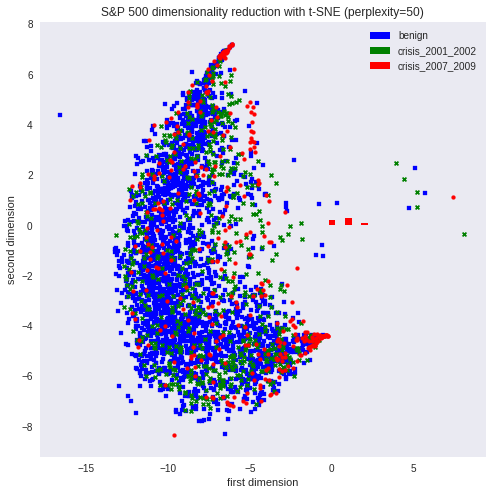

In [97]:
plot_tsne_2D(df_tsne, 'regime', 'S&P 500 dimensionality reduction with t-SNE (perplexity=%d)' % perplexity)